### Análise de Componentes Principais

In [1]:
using DelimitedFiles

In [2]:
iris, iris_names = readdlm("iris.csv",',',header=true)

(Any[5.1 3.5 … 0.2 "Iris-setosa"; 4.9 3.0 … 0.2 "Iris-setosa"; … ; 6.2 3.4 … 2.3 "Iris-virginica"; 5.9 3.0 … 1.8 "Iris-virginica"], AbstractString["sepal_length" "sepal_width" … "petal_width" "species"])

In [3]:
# Observe que o laço itera nos elementos de iris_names.
# Não é necessário criar índices e iterar neles
for nam in iris_names
    println(nam)
end

sepal_length
sepal_width
petal_length
petal_width
species


In [4]:
iris

150×5 Array{Any,2}:
 5.1  3.5  1.4  0.2  "Iris-setosa"   
 4.9  3.0  1.4  0.2  "Iris-setosa"   
 4.7  3.2  1.3  0.2  "Iris-setosa"   
 4.6  3.1  1.5  0.2  "Iris-setosa"   
 5.0  3.6  1.4  0.2  "Iris-setosa"   
 5.4  3.9  1.7  0.4  "Iris-setosa"   
 4.6  3.4  1.4  0.3  "Iris-setosa"   
 5.0  3.4  1.5  0.2  "Iris-setosa"   
 4.4  2.9  1.4  0.2  "Iris-setosa"   
 4.9  3.1  1.5  0.1  "Iris-setosa"   
 5.4  3.7  1.5  0.2  "Iris-setosa"   
 4.8  3.4  1.6  0.2  "Iris-setosa"   
 4.8  3.0  1.4  0.1  "Iris-setosa"   
 ⋮                                   
 6.0  3.0  4.8  1.8  "Iris-virginica"
 6.9  3.1  5.4  2.1  "Iris-virginica"
 6.7  3.1  5.6  2.4  "Iris-virginica"
 6.9  3.1  5.1  2.3  "Iris-virginica"
 5.8  2.7  5.1  1.9  "Iris-virginica"
 6.8  3.2  5.9  2.3  "Iris-virginica"
 6.7  3.3  5.7  2.5  "Iris-virginica"
 6.7  3.0  5.2  2.3  "Iris-virginica"
 6.3  2.5  5.0  1.9  "Iris-virginica"
 6.5  3.0  5.2  2.0  "Iris-virginica"
 6.2  3.4  5.4  2.3  "Iris-virginica"
 5.9  3.0  5.1  1.8  "Iris-vir

In [5]:
# Esse comando pede todas as linhas da iris, bem como as colunas de 1 a 4
# Mas o tipo continua sendo Array{Any,2}
iris[:,1:4]

150×4 Array{Any,2}:
 5.1  3.5  1.4  0.2
 4.9  3.0  1.4  0.2
 4.7  3.2  1.3  0.2
 4.6  3.1  1.5  0.2
 5.0  3.6  1.4  0.2
 5.4  3.9  1.7  0.4
 4.6  3.4  1.4  0.3
 5.0  3.4  1.5  0.2
 4.4  2.9  1.4  0.2
 4.9  3.1  1.5  0.1
 5.4  3.7  1.5  0.2
 4.8  3.4  1.6  0.2
 4.8  3.0  1.4  0.1
 ⋮                 
 6.0  3.0  4.8  1.8
 6.9  3.1  5.4  2.1
 6.7  3.1  5.6  2.4
 6.9  3.1  5.1  2.3
 5.8  2.7  5.1  1.9
 6.8  3.2  5.9  2.3
 6.7  3.3  5.7  2.5
 6.7  3.0  5.2  2.3
 6.3  2.5  5.0  1.9
 6.5  3.0  5.2  2.0
 6.2  3.4  5.4  2.3
 5.9  3.0  5.1  1.8

In [6]:
# Na dúvida é melhor converter
X = float.(iris[:,1:4])

150×4 Array{Float64,2}:
 5.1  3.5  1.4  0.2
 4.9  3.0  1.4  0.2
 4.7  3.2  1.3  0.2
 4.6  3.1  1.5  0.2
 5.0  3.6  1.4  0.2
 5.4  3.9  1.7  0.4
 4.6  3.4  1.4  0.3
 5.0  3.4  1.5  0.2
 4.4  2.9  1.4  0.2
 4.9  3.1  1.5  0.1
 5.4  3.7  1.5  0.2
 4.8  3.4  1.6  0.2
 4.8  3.0  1.4  0.1
 ⋮                 
 6.0  3.0  4.8  1.8
 6.9  3.1  5.4  2.1
 6.7  3.1  5.6  2.4
 6.9  3.1  5.1  2.3
 5.8  2.7  5.1  1.9
 6.8  3.2  5.9  2.3
 6.7  3.3  5.7  2.5
 6.7  3.0  5.2  2.3
 6.3  2.5  5.0  1.9
 6.5  3.0  5.2  2.0
 6.2  3.4  5.4  2.3
 5.9  3.0  5.1  1.8

In [7]:
using Plots
gr(legend=:none)

Plots.GRBackend()

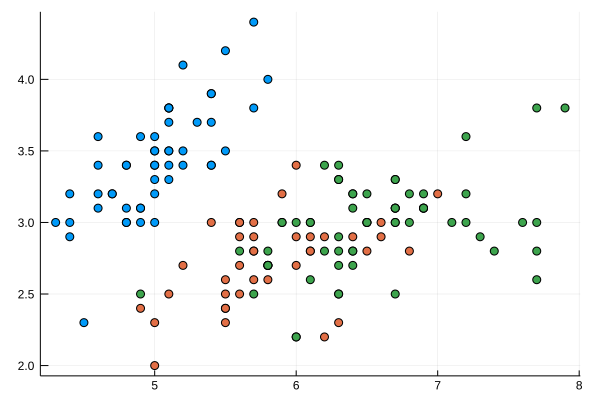

In [8]:
# usando esse pacote, descrevemos:
# plot(valores_eixo_x, valores_eixo_y)
# o resto é opção para especificar o tyipo de gráfico.
plot(X[:,1], X[:,2], seriestype=:scatter, group=iris[:,5])

In [9]:
using Statistics

In [10]:
# dims = 1 é necessário para que a média seja feita nas colunas de X
# dims = 2 faz a média nas linhas e não especificar faz a média de toas as entradas de X
μ = mean(X, dims=1)

1×4 Array{Float64,2}:
 5.84333  3.05733  3.758  1.19933

In [11]:
# Dica: quando usar dims = 1 para a média você vai querer usar dims = 1 para cov
# Nesse caso, cov(X,dims=2) produz uma matriz 150 x 150
# O padrão é retornar o estimador não viesado. Caso queira o estimador viesado
# basta fazer cov(X, dims=1, corrected=false)
S = cov(X, dims=1)

4×4 Array{Float64,2}:
  0.685694  -0.042434   1.27432    0.516271
 -0.042434   0.189979  -0.329656  -0.121639
  1.27432   -0.329656   3.11628    1.29561 
  0.516271  -0.121639   1.29561    0.581006

In [12]:
?cov

search: cov convert StackOverflowError code_llvm @code_llvm code_native



```
cov(x::AbstractVector; corrected::Bool=true)
```

Compute the variance of the vector `x`. If `corrected` is `true` (the default) then the sum is scaled with `n-1`, whereas the sum is scaled with `n` if `corrected` is `false` where `n = length(x)`.

---

```
cov(X::AbstractMatrix; dims::Int=1, corrected::Bool=true)
```

Compute the covariance matrix of the matrix `X` along the dimension `dims`. If `corrected` is `true` (the default) then the sum is scaled with `n-1`, whereas the sum is scaled with `n` if `corrected` is `false` where `n = size(X, dims)`.

---

```
cov(x::AbstractVector, y::AbstractVector; corrected::Bool=true)
```

Compute the covariance between the vectors `x` and `y`. If `corrected` is `true` (the default), computes $\frac{1}{n-1}\sum_{i=1}^n (x_i-\bar x) (y_i-\bar y)^*$ where $*$ denotes the complex conjugate and `n = length(x) = length(y)`. If `corrected` is `false`, computes $\frac{1}{n}\sum_{i=1}^n (x_i-\bar x) (y_i-\bar y)^*$.

---

```
cov(X::AbstractVecOrMat, Y::AbstractVecOrMat; dims::Int=1, corrected::Bool=true)
```

Compute the covariance between the vectors or matrices `X` and `Y` along the dimension `dims`. If `corrected` is `true` (the default) then the sum is scaled with `n-1`, whereas the sum is scaled with `n` if `corrected` is `false` where `n = size(X, dims) = size(Y, dims)`.

---

```
cov(X, w::AbstractWeights; mean=nothing, vardim=1, corrected=false)
```

Compute the weighted covariance matrix. Similar to `var` and `std` the biased covariance matrix (`corrected=false`) is computed by multiplying `scattermat(X, w)` by $\frac{1}{\sum{w}}$ to normalize. However, the unbiased covariance matrix (`corrected=true`) is dependent on the type of weights used:

  * `AnalyticWeights`: $\frac{1}{\sum w - \sum {w^2} / \sum w}$
  * `FrequencyWeights`: $\frac{1}{\sum{w} - 1}$
  * `ProbabilityWeights`: $\frac{n}{(n - 1) \sum w}$ where $n$ equals `count(!iszero, w)`
  * `Weights`: `ArgumentError` (bias correction not supported)


In [13]:
using LinearAlgebra

In [14]:
# eigen não devolve uma tupla mas sim um tipo com dois atributos
# .values, a lista de autovalores
# .vectors, uma matriz cujas colunas são os autovetores
eig = eigen(S)

Eigen{Float64,Float64,Array{Float64,2},Array{Float64,1}}
eigenvalues:
4-element Array{Float64,1}:
 0.023835092973449216
 0.0782095000429191  
 0.24267074792863333 
 4.228241706034862   
eigenvectors:
4×4 Array{Float64,2}:
  0.315487   0.58203     0.656589  -0.361387 
 -0.319723  -0.597911    0.730161   0.0845225
 -0.479839  -0.0762361  -0.173373  -0.856671 
  0.753657  -0.545831   -0.075481  -0.358289 

In [15]:
#= Daqui pra frente eu apresento algumas maneiras de lidar com a ordenação crescente dos
atovalores, mas o problema poderia ter sido resolvido uma única vez aqui, bastaria fazer:
P = eig.vectors[end:-1:1]
λ = eig.values[end:-1:1]
=#
P = eig.vectors
λ = eig.values
Λ = diagm(0 => λ)

4×4 Array{Float64,2}:
 0.0238351  0.0        0.0       0.0    
 0.0        0.0782095  0.0       0.0    
 0.0        0.0        0.242671  0.0    
 0.0        0.0        0.0       4.22824

In [16]:
# Sanity check: P é ortonormal
P*P'

4×4 Array{Float64,2}:
 1.0           2.82627e-16   1.58656e-16   1.4577e-16 
 2.82627e-16   1.0          -3.78591e-17  -1.59295e-16
 1.58656e-16  -3.78591e-17   1.0           1.36034e-16
 1.4577e-16   -1.59295e-16   1.36034e-16   1.0        

In [17]:
# Sanity check: diagonalização está correta
P*Λ*P' - S

4×4 Array{Float64,2}:
 -6.66134e-16   2.01228e-16  -1.55431e-15   0.0        
  1.94289e-16  -2.77556e-17   3.88578e-16  -1.38778e-17
 -1.55431e-15   3.88578e-16  -3.9968e-15   -2.22045e-16
  0.0          -1.38778e-17  -2.22045e-16   0.0        

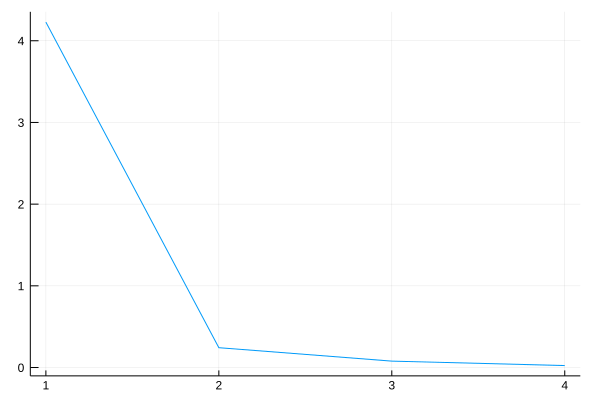

In [18]:
# scree plot
scree = plot(4:-1:1, λ)

# outra possibilidade:
# plot(1:4, reverse(λ))
scree

In [19]:
# função para retornar um vetor com o principal ratio acumulado
function princratio(λ)
    acc = cumsum∘reverse
    return acc(λ)/sum(λ)
end
princratio(λ)

4-element Array{Float64,1}:
 0.9246187232017271
 0.9776852063187949
 0.9947878161267246
 1.0               

In [20]:
# Y = (X .- μ)*P[:,[end,end-1]] se quiser apenas as 2 primeiras componentes transformadas

Y = (X .- μ)*P

150×4 Array{Float64,2}:
  0.00226244   0.0279148   0.319397    2.68413
  0.0990266    0.210464   -0.177001    2.71414
  0.0199684   -0.0179003  -0.144949    2.88899
 -0.0755758   -0.0315594  -0.318299    2.74534
 -0.0612586   -0.0900792   0.326755    2.72872
 -0.0242009   -0.168678    0.74133     2.28086
 -0.0481431   -0.257892   -0.0894614   2.82054
 -0.0452979    0.0218793   0.163385    2.62614
 -0.0267447   -0.0207596  -0.578312    2.88638
 -0.0562954    0.197633   -0.113774    2.67276
 -0.0150199    0.075318    0.645069    2.50695
 -0.156379    -0.10215     0.0147299   2.61276
 -0.00788791   0.206844   -0.235112    2.78611
  ⋮                                           
  0.0204618   -0.281836   -0.16499    -1.16933
  0.210622    -0.0272911   0.372288   -2.10761
  0.277654    -0.322694    0.183651   -2.31415
  0.505305    -0.113587    0.409203   -1.92227
 -0.0153047   -0.296323   -0.574916   -1.41524
  0.0579127   -0.29257     0.277863   -2.56301
  0.241091    -0.504483    0.304798 

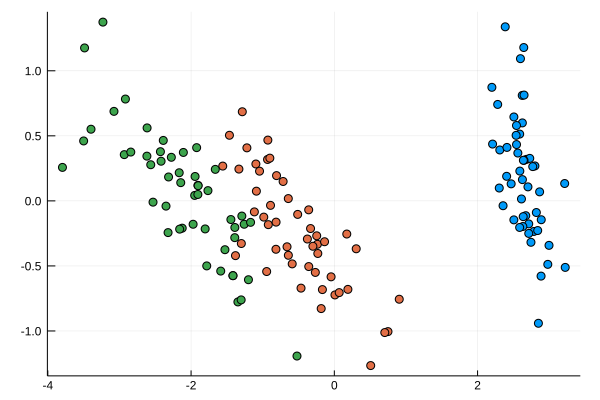

In [21]:
scatter(Y[:,end],Y[:,end-1], group=iris[:,5])

In [22]:
using MultivariateStats

Esse pacote permite criar um "modelo", que é uma instância de um tipo chamado PCA. Esse tipo pode ser usado em algumas funções. A função fit é, na verdade um construtor de uma instância desse tipo.

Uma vez realizado o "ajuste", funções que recebem o tipo PCA como entrada podem ser chamadas.

obs: as "" em ajuste e modelo foram colocadas para mostrar o desgosto pessoal que eu tenho com a utilização desses termos nesse contexto.

In [23]:
# IMPORTANTE: esse pacote convenciona organizar os indivíduos nas colunas da matriz
M = fit(PCA,X')

PCA(indim = 4, outdim = 3, principalratio = 0.99479)

In [24]:
# O valor padrão de principalratio é 0.99
# Se desejar que o modelo contenha todos os dados é necessário fazer
M = fit(PCA,X', pratio = 1.0)

PCA(indim = 4, outdim = 4, principalratio = 1.00000)

In [25]:
# checando os autovalores
principalvars(M)

4-element Array{Float64,1}:
 4.2282417060348605 
 0.24267074792863347
 0.07820950004291893
 0.02383509297344946

In [26]:
# checando os autovetores
projection(M)

4×4 Array{Float64,2}:
 -0.361387    0.656589   0.58203     0.315487
  0.0845225   0.730161  -0.597911   -0.319723
 -0.856671   -0.173373  -0.0762361  -0.479839
 -0.358289   -0.075481  -0.545831    0.753657

In [27]:
Y2 = transform(M,X')

4×150 Array{Float64,2}:
 2.68413      2.71414     2.88899    …  -1.76435    -1.90094    -1.39019 
 0.319397    -0.177001   -0.144949       0.0788589   0.116628   -0.282661
 0.0279148    0.210464   -0.0179003     -0.130482   -0.723252   -0.36291 
 0.00226244   0.0990266   0.0199684      0.137001    0.0445953  -0.155039

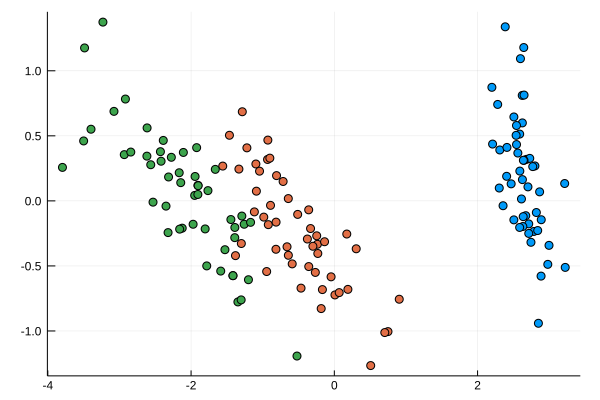

In [28]:
# Note que Y2 contém as componentes principais nas linhas
pl = scatter(Y2[1,:],Y2[2,:], group=iris[:,5])

### Adicionando coisas que perguntaram e não soube responder:

Tem método implementado para achar estimador de máxima verossimilhança. A busca que fiz na sala falhou porque ela está no pacote `Distributions`, que não estava carregado

In [29]:
using Distributions

In [30]:
?mle

search: MLEstimator fit_mle fit_mle! sample complex Complex sampler sample!

Couldn't find mle
Perhaps you meant mul!, mgf, mode, mov, mp4, map, max, min, mod, mv, pl or kde


No documentation found.

Binding `mle` does not exist.


Observe que a busca fuzzy apontou os nomes certos.

Agora, sobre a questão de descobrir as funções associadas a um módulo, algumas coisas:

In [31]:
# methodswith recebe um tipo e retorna uma lista de funções que recebem aquele tipo
# Nesse caso podemos ver as funções para extrair as informações do modelo PCA
methodswith(PCA)

[1] mean(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:33
[2] dump(io::IO, M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:59
[3] show(io::IO, M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:54
[4] indim(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:30
[5] outdim(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:31
[6] principalratio(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:44
[7] principalvar(M::PCA, i::Int64) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:37
[8] principalvars(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:38
[9] projection(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:35
[10] reconstruct(M::PCA{T}, y::Union{AbstractArray{T,1}, AbstractArray{T,2}}) where T<:AbstractFloat in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:49
[11] tprincipalvar(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:40
[12] transform(M::PCA{T}, x::Union{AbstractArray{T,1}, AbstractArray{T,2}}) where T<:AbstractFloat in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:48
[13] tresidualvar(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:41
[14] tvar(M::PCA) in MultivariateStats at /home/chong/.julia/packages/MultivariateStats/nNJuu/src/pca.jl:42

In [32]:
# Já o varinfo recebe um Módulo (pacote) e lista õs nomes exportados.
# A convenção de nomenclatura é tipos começam com letra maiúscula, 
# como exemplificado por Int64, Array ou PCA. Já funções recebom nomes
# começando em minúsculas. Dessa forma os tipos e funções ficam separados
varinfo(Distributions)

| name                               |      size | summary                      |
|:---------------------------------- | ---------:|:---------------------------- |
| +                                  |   0 bytes | typeof(+)                    |
| -                                  |   0 bytes | typeof(-)                    |
| AbstractMixtureModel               | 200 bytes | UnionAll                     |
| AbstractMvNormal                   | 172 bytes | DataType                     |
| Arcsine                            |  40 bytes | UnionAll                     |
| Bernoulli                          |  40 bytes | UnionAll                     |
| Beta                               |  40 bytes | UnionAll                     |
| BetaBinomial                       |  40 bytes | UnionAll                     |
| BetaPrime                          |  40 bytes | UnionAll                     |
| Binomial                           |  40 bytes | UnionAll                     |
| Biweight                           |  40 bytes | UnionAll                     |
| Categorical                        |  40 bytes | UnionAll                     |
| Cauchy                             |  40 bytes | UnionAll                     |
| Chi                                |  40 bytes | UnionAll                     |
| Chisq                              |  40 bytes | UnionAll                     |
| Continuous                         | 172 bytes | DataType                     |
| ContinuousDistribution             |  40 bytes | UnionAll                     |
| ContinuousMatrixDistribution       | 196 bytes | DataType                     |
| ContinuousMultivariateDistribution | 196 bytes | DataType                     |
| ContinuousUnivariateDistribution   | 196 bytes | DataType                     |
| Cosine                             |  40 bytes | UnionAll                     |
| DiagNormal                         | 220 bytes | DataType                     |
| DiagNormalCanon                    | 228 bytes | DataType                     |
| Dirichlet                          |  40 bytes | UnionAll                     |
| DirichletMultinomial               |  40 bytes | UnionAll                     |
| Discrete                           | 172 bytes | DataType                     |
| DiscreteDistribution               |  40 bytes | UnionAll                     |
| DiscreteMatrixDistribution         | 196 bytes | DataType                     |
| DiscreteMultivariateDistribution   | 196 bytes | DataType                     |
| DiscreteUniform                    | 204 bytes | DataType                     |
| DiscreteUnivariateDistribution     | 196 bytes | DataType                     |
| Distribution                       |  80 bytes | UnionAll                     |
| Distributions                      | 1.148 MiB | Module                       |
| DoubleExponential                  |  40 bytes | UnionAll                     |
| EdgeworthMean                      |  80 bytes | UnionAll                     |
| EdgeworthSum                       |  80 bytes | UnionAll                     |
| EdgeworthZ                         |  80 bytes | UnionAll                     |
| EmpiricalUnivariateDistribution    | 260 bytes | DataType                     |
| Epanechnikov                       |  40 bytes | UnionAll                     |
| Erlang                             |  40 bytes | UnionAll                     |
| Estimator                          | 120 bytes | UnionAll                     |
| Exponential                        |  40 bytes | UnionAll                     |
| FDist                              |  40 bytes | UnionAll                     |
| FisherNoncentralHypergeometric     |  40 bytes | UnionAll                     |
| Frechet                            |  40 bytes | UnionAll                     |
| FullNormal                         | 220 bytes | DataType                     |
| FullNormalCanon                    | 228 bytes | DataType                     |
| Gamma                              |  40 bytes | UnionAll                     |
| GeneralizedExtremeValue            |  40 bytes | UnionAll                     |
| GeneralizedPareto                  |  40 bytes | UnionAll                     |
| Geometric                          |  40 bytes | UnionAll                     |
| Gumbel                             |  40 bytes | UnionAll                     |
| Hypergeometric                     | 204 bytes | DataType                     |
| InverseGamma                       |  40 bytes | UnionAll                     |
| InverseGaussian                    |  40 bytes | UnionAll                     |
| InverseWishart                     | 120 bytes | UnionAll                     |
| IsoNormal                          | 220 bytes | DataType                     |
| IsoNormalCanon                     | 228 bytes | DataType                     |
| KSDist                             | 188 bytes | DataType                     |
| KSOneSided                         | 188 bytes | DataType                     |
| Kolmogorov                         | 172 bytes | DataType                     |
| Laplace                            |  40 bytes | UnionAll                     |
| Levy                               |  40 bytes | UnionAll                     |
| LocationScale                      |  80 bytes | UnionAll                     |
| LogNormal                          |  40 bytes | UnionAll                     |
| Logistic                           |  40 bytes | UnionAll                     |
| MLEstimator                        | 120 bytes | UnionAll                     |
| MatrixDistribution                 |  40 bytes | UnionAll                     |
| Matrixvariate                      | 172 bytes | DataType                     |
| MixtureModel                       | 200 bytes | UnionAll                     |
| Multinomial                        |  40 bytes | UnionAll                     |
| Multivariate                       | 172 bytes | DataType                     |
| MultivariateDistribution           |  40 bytes | UnionAll                     |
| MultivariateMixture                | 160 bytes | UnionAll                     |
| MultivariateNormal                 | 256 bytes | UnionAll                     |
| MvLogNormal                        | 256 bytes | UnionAll                     |
| MvNormal                           | 256 bytes | UnionAll                     |
| MvNormalCanon                      | 256 bytes | UnionAll                     |
| MvNormalKnownCov                   |  80 bytes | UnionAll                     |
| MvTDist                            | 236 bytes | DataType                     |
| NegativeBinomial                   |  40 bytes | UnionAll                     |
| NonMatrixDistribution              |  96 bytes | Union                        |
| NoncentralBeta                     |  40 bytes | UnionAll                     |
| NoncentralChisq                    |  40 bytes | UnionAll                     |
| NoncentralF                        |  40 bytes | UnionAll                     |
| NoncentralHypergeometric           |  40 bytes | UnionAll                     |
| NoncentralT                        |  40 bytes | UnionAll                     |
| Normal                             |  40 bytes | UnionAll                     |
| NormalCanon                        |  40 bytes | UnionAll                     |
| NormalInverseGaussian              |  40 bytes | UnionAll                     |
| Pareto                             |  40 bytes | UnionAll                     |
| Poisson                            |  40 bytes | UnionAll                     |
| PoissonBinomial                    |  40 bytes | UnionAll                     |
| QQPair                             | 196 bytes | DataType                     |
| Rayleigh                           |  40 bytes | UnionAll                     |
| RealInterval                       | 196 bytes | DataType                     |
| Sampleable                         |  80 bytes | UnionAll                     |
| Semicircle                         |  40 bytes | UnionAll                     |
| Skellam                            |  40 bytes | UnionAll                     |
| SufficientStats                    | 172 bytes | DataType                     |
| SymTriangularDist                  |  40 bytes | UnionAll                     |
| TDist                              |  40 bytes | UnionAll                     |
| TriangularDist                     |  40 bytes | UnionAll                     |
| Triweight                          |  40 bytes | UnionAll                     |
| Truncated                          | 120 bytes | UnionAll                     |
| TruncatedNormal                    |   0 bytes | typeof(TruncatedNormal)      |
| Uniform                            |  40 bytes | UnionAll                     |
| Univariate                         | 172 bytes | DataType                     |
| UnivariateDistribution             |  40 bytes | UnionAll                     |
| UnivariateGMM                      | 252 bytes | DataType                     |
| UnivariateMixture                  | 160 bytes | UnionAll                     |
| ValueSupport                       | 172 bytes | DataType                     |
| VariateForm                        | 172 bytes | DataType                     |
| VonMises                           |  40 bytes | UnionAll                     |
| VonMisesFisher                     |  40 bytes | UnionAll                     |
| WalleniusNoncentralHypergeometric  |  40 bytes | UnionAll                     |
| Weibull                            |  40 bytes | UnionAll                     |
| Wishart                            | 120 bytes | UnionAll                     |
| ZeroMeanDiagNormal                 | 220 bytes | DataType                     |
| ZeroMeanDiagNormalCanon            | 228 bytes | DataType                     |
| ZeroMeanFullNormal                 | 220 bytes | DataType                     |
| ZeroMeanFullNormalCanon            | 228 bytes | DataType                     |
| ZeroMeanIsoNormal                  | 220 bytes | DataType                     |
| ZeroMeanIsoNormalCanon             | 228 bytes | DataType                     |
| canonform                          |   0 bytes | typeof(canonform)            |
| ccdf                               |   0 bytes | typeof(ccdf)                 |
| cdf                                |   0 bytes | typeof(cdf)                  |
| cf                                 |   0 bytes | typeof(cf)                   |
| circvar                            |   0 bytes | typeof(circvar)              |
| component                          |   0 bytes | typeof(component)            |
| components                         |   0 bytes | typeof(components)           |
| componentwise_logpdf               |   0 bytes | typeof(componentwise_logpdf) |
| componentwise_pdf                  |   0 bytes | typeof(componentwise_pdf)    |
| concentration                      |   0 bytes | typeof(concentration)        |
| cor                                |   0 bytes | typeof(cor)                  |
| cov                                |   0 bytes | typeof(cov)                  |
| cquantile                          |   0 bytes | typeof(cquantile)            |
| dim                                |   0 bytes | typeof(dim)                  |
| dof                                |   0 bytes | typeof(dof)                  |
| entropy                            |   0 bytes | typeof(entropy)              |
| estimate                           |   0 bytes | typeof(estimate)             |
| expected_logdet                    |   0 bytes | typeof(expected_logdet)      |
| failprob                           |   0 bytes | typeof(failprob)             |
| fit                                |   0 bytes | typeof(fit)                  |
| fit_mle                            |   0 bytes | typeof(fit_mle)              |
| gradlogpdf                         |   0 bytes | typeof(gradlogpdf)           |
| hasfinitesupport                   |   0 bytes | typeof(hasfinitesupport)     |
| insupport                          |   0 bytes | typeof(insupport)            |
| invcov                             |   0 bytes | typeof(invcov)               |
| invlogccdf                         |   0 bytes | typeof(invlogccdf)           |
| invlogcdf                          |   0 bytes | typeof(invlogcdf)            |
| invscale                           |   0 bytes | typeof(invscale)             |
| isbounded                          |   0 bytes | typeof(isbounded)            |
| isleptokurtic                      |   0 bytes | typeof(isleptokurtic)        |
| islowerbounded                     |   0 bytes | typeof(islowerbounded)       |
| ismesokurtic                       |   0 bytes | typeof(ismesokurtic)         |
| isplatykurtic                      |   0 bytes | typeof(isplatykurtic)        |
| isprobvec                          |   0 bytes | typeof(isprobvec)            |
| isupperbounded                     |   0 bytes | typeof(isupperbounded)       |
| kurtosis                           |   0 bytes | typeof(kurtosis)             |
| location                           |   0 bytes | typeof(location)             |
| location!                          |   0 bytes | typeof(location!)            |
| logccdf                            |   0 bytes | typeof(logccdf)              |
| logcdf                             |   0 bytes | typeof(logcdf)               |
| logdetcov                          |   0 bytes | typeof(logdetcov)            |
| loglikelihood                      |   0 bytes | typeof(loglikelihood)        |
| logpdf                             |   0 bytes | typeof(logpdf)               |
| logpdf!                            |   0 bytes | typeof(logpdf!)              |
| mean                               |   0 bytes | typeof(mean)                 |
| meandir                            |   0 bytes | typeof(meandir)              |
| meanform                           |   0 bytes | typeof(meanform)             |
| meanlogx                           |   0 bytes | typeof(meanlogx)             |
| median                             |   0 bytes | typeof(median)               |
| mgf                                |   0 bytes | typeof(mgf)                  |
| mode                               |   0 bytes | typeof(mode)                 |
| modes                              |   0 bytes | typeof(modes)                |
| moment                             |   0 bytes | typeof(moment)               |
| ncategories                        |   0 bytes | typeof(ncategories)          |
| ncomponents                        |   0 bytes | typeof(ncomponents)          |
| nsamples                           |   0 bytes | typeof(nsamples)             |
| ntrials                            |   0 bytes | typeof(ntrials)              |
| params                             |   0 bytes | typeof(params)               |
| params!                            |   0 bytes | typeof(params!)              |
| partype                            |   0 bytes | typeof(partype)              |
| pdf                                |   0 bytes | typeof(pdf)                  |
| probs                              |   0 bytes | typeof(probs)                |
| probval                            |   0 bytes | typeof(probval)              |
| qqbuild                            |   0 bytes | typeof(qqbuild)              |
| quantile                           |   0 bytes | typeof(quantile)             |
| rate                               |   0 bytes | typeof(rate)                 |
| sample                             |   0 bytes | typeof(sample)               |
| sample!                            |   0 bytes | typeof(sample!)              |
| sampler                            |   0 bytes | typeof(sampler)              |
| scale                              |   0 bytes | typeof(scale)                |
| scale!                             |   0 bytes | typeof(scale!)               |
| shape                              |   0 bytes | typeof(shape)                |
| skewness                           |   0 bytes | typeof(skewness)             |
| span                               |   0 bytes | typeof(span)                 |
| sqmahal                            |   0 bytes | typeof(sqmahal)              |
| sqmahal!                           |   0 bytes | typeof(sqmahal!)             |
| std                                |   0 bytes | typeof(std)                  |
| stdlogx                            |   0 bytes | typeof(stdlogx)              |
| succprob                           |   0 bytes | typeof(succprob)             |
| suffstats                          |   0 bytes | typeof(suffstats)            |
| support                            |   0 bytes | typeof(support)              |
| test_distr                         |   0 bytes | typeof(test_distr)           |
| test_samples                       |   0 bytes | typeof(test_samples)         |
| var                                |   0 bytes | typeof(var)                  |
| varlogx                            |   0 bytes | typeof(varlogx)              |
| wsample                            |   0 bytes | typeof(wsample)              |
| wsample!                           |   0 bytes | typeof(wsample!)             |


Agora, se quiser aplicar algum tipo de filtro as opções que encontrei são:

In [33]:
# 1 - retorna uma lista de símbolos exportados pelo módulo
names(Distributions)

219-element Array{Symbol,1}:
 :+                   
 :-                   
 :AbstractMixtureModel
 :AbstractMvNormal    
 :Arcsine             
 :Bernoulli           
 :Beta                
 :BetaBinomial        
 :BetaPrime           
 :Binomial            
 :Biweight            
 :Categorical         
 :Cauchy              
 ⋮                    
 :sqmahal!            
 :std                 
 :stdlogx             
 :succprob            
 :suffstats           
 :support             
 :test_distr          
 :test_samples        
 :var                 
 :varlogx             
 :wsample             
 :wsample!            

In [34]:
# 2 - transformar essa info em string
listfuncsandtypes(x) = map(string, names(x))
distr_names = listfuncsandtypes(Distributions)

219-element Array{String,1}:
 "+"                   
 "-"                   
 "AbstractMixtureModel"
 "AbstractMvNormal"    
 "Arcsine"             
 "Bernoulli"           
 "Beta"                
 "BetaBinomial"        
 "BetaPrime"           
 "Binomial"            
 "Biweight"            
 "Categorical"         
 "Cauchy"              
 ⋮                     
 "sqmahal!"            
 "std"                 
 "stdlogx"             
 "succprob"            
 "suffstats"           
 "support"             
 "test_distr"          
 "test_samples"        
 "var"                 
 "varlogx"             
 "wsample"             
 "wsample!"            

In [35]:
# e aí podemos filtrar por Maiúsculas minúsculas se quisermos tipos ou funções
distr_funcs = filter(st-> st >="a", distr_names)

95-element Array{String,1}:
 "binaryentropy"       
 "canonform"           
 "ccdf"                
 "cdf"                 
 "cf"                  
 "cgf"                 
 "circvar"             
 "component"           
 "components"          
 "componentwise_logpdf"
 "componentwise_pdf"   
 "concentration"       
 "cor"                 
 ⋮                     
 "sqmahal!"            
 "std"                 
 "stdlogx"             
 "succprob"            
 "suffstats"           
 "support"             
 "test_distr"          
 "test_samples"        
 "var"                 
 "varlogx"             
 "wsample"             
 "wsample!"            

In [36]:
# Esse reshape deixa sobrar algumas (3) variáveis, mas só pra mostrar que
# é possível dar uma boa filtrada aí
reshape(distr_funcs[1:92],23,4)

23×4 Array{String,2}:
 "binaryentropy"         "fit_map"           "logccdf"        "probs"       
 "canonform"             "fit_map!"          "logcdf"         "probval"     
 "ccdf"                  "fit_mle"           "logdetcov"      "qqbuild"     
 "cdf"                   "fit_mle!"          "loglikelihood"  "quantile"    
 "cf"                    "freecumulant"      "logpdf"         "rate"        
 "cgf"                   "gradlogpdf"        "logpdf!"        "sample"      
 "circvar"               "hasfinitesupport"  "mean"           "sample!"     
 "component"             "insupport"         "meandir"        "sampler"     
 "components"            "invcov"            "meanform"       "scale"       
 "componentwise_logpdf"  "invlogccdf"        "meanlogx"       "scale!"      
 "componentwise_pdf"     "invlogcdf"         "median"         "shape"       
 "concentration"         "invscale"          "mgf"            "skewness"    
 "cor"                   "isbounded"         "mode"   